# ESM-GCN
---
## Predicted vs Measured
### Extracting the values
This was performed in the script `fig3-esm_gcn-r2_values.py`.

### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [1]:
import os
import pandas as pd

data_dir = "../../../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot
Binding

In [2]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('ticks')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10.25))
    ax = plt.gca()

    measured = "measured_value"
    predicted = "predicted_value"

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df[measured] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df[measured] - merged_df[predicted])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    # Calculate R² for test data
    train_all_df = merged_df[merged_df['mode'] == 'train']
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df[measured], test_all_df[predicted])
    print(f"R^2: {r2_value}")

    train_outside_df = outside_threshold[outside_threshold['mode'] == 'train']
    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df[measured], test_outside_df[predicted])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    train_inside_df = within_threshold[within_threshold['mode'] == 'train']
    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df[measured], test_inside_df[predicted])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    sns.scatterplot(
        x=test_inside_df[measured],
        y=test_inside_df[predicted],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    sns.scatterplot(
        x=train_inside_df[measured],
        y=train_inside_df[predicted],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x=measured,
        y=predicted,
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )
    print(f"Number of TRAIN points outside of error threshold: {len(train_outside_df)}, or {(len(train_outside_df)/len(train_all_df))*100:.2f}% of all train points")
    print(f"Number of TEST points outside of error threshold: {len(test_outside_df)}, or {(len(test_outside_df)/len(test_all_df))*100:.2f}% of all test points")

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.grid(axis="x", linestyle="--", alpha=0.7)

    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=600, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=600, bbox_inches='tight')
    return r2_value

R^2: 0.622462984954167
R^2 outside of threshold: -0.14008054409738357
R^2 inside of threshold: 0.9580886330906584
Number of TRAIN points outside of error threshold: 24041, or 29.25% of all train points
Number of TEST points outside of error threshold: 7466, or 36.11% of all test points


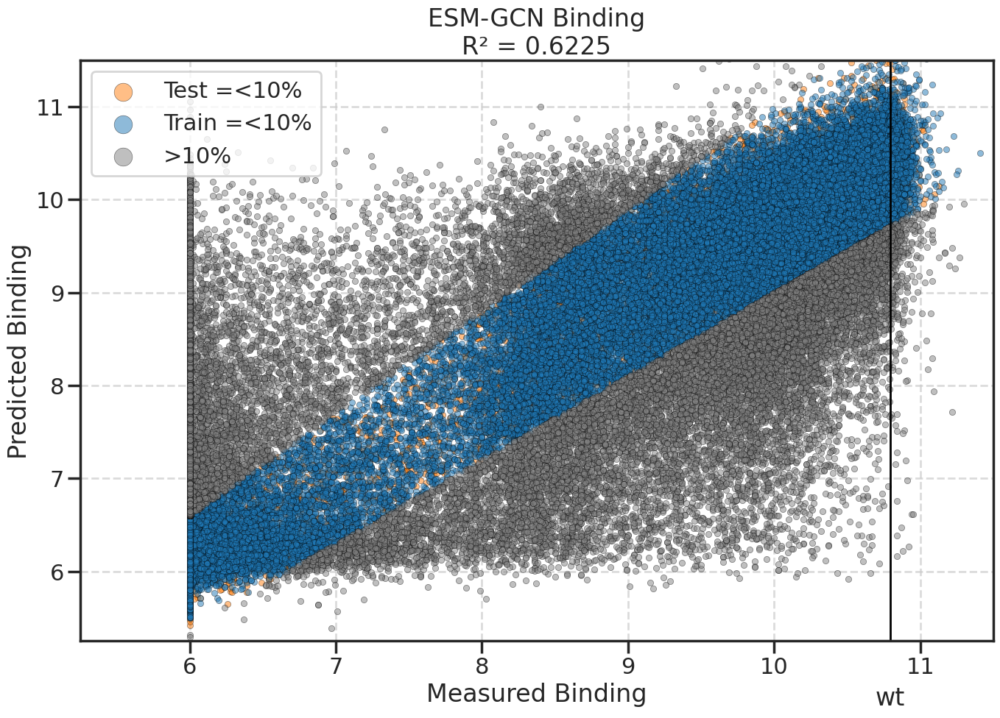

In [3]:
df = pd.read_csv("esm_gcn/esm_gcn.A.binding-predicted_vs_measured.values.csv")
esm_gcn_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.A.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.6232924351054802
R^2 outside of threshold: -0.059208554734774044
R^2 inside of threshold: 0.9571015180841123
Number of TRAIN points outside of error threshold: 28800, or 35.05% of all train points
Number of TEST points outside of error threshold: 7834, or 37.89% of all test points


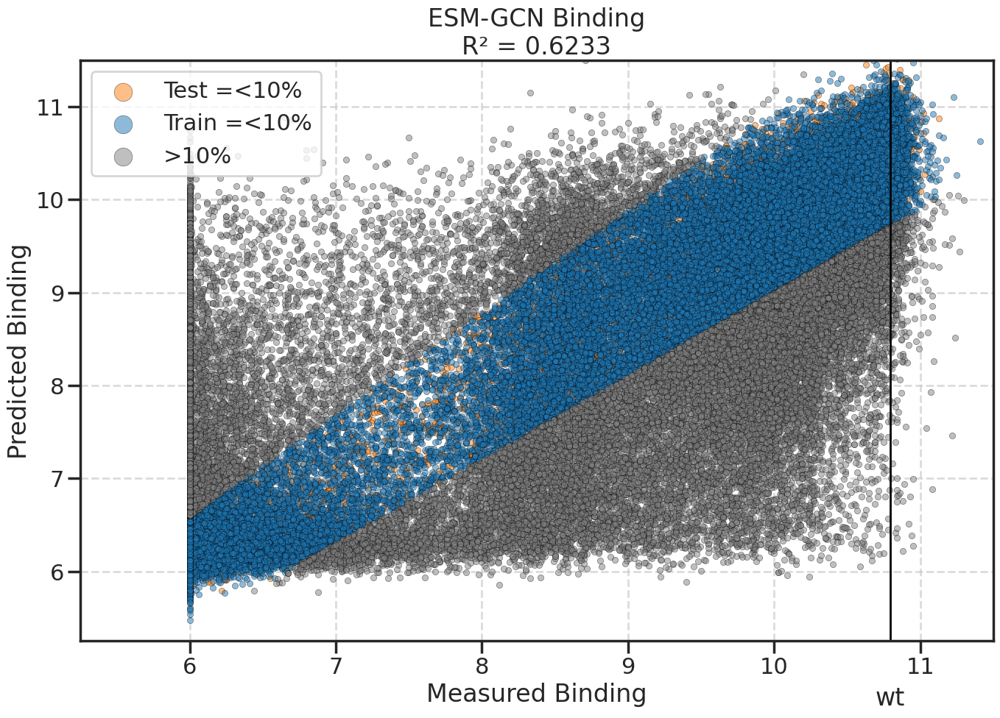

In [4]:
df = pd.read_csv("esm_gcn/esm_gcn.B.binding-predicted_vs_measured.values.csv")
esm_gcn_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.B.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9195505139243738
R^2 outside of threshold: -0.6315265236170979
R^2 inside of threshold: 0.9868875457090966
Number of TRAIN points outside of error threshold: 2, or 0.00% of all train points
Number of TEST points outside of error threshold: 1964, or 9.50% of all test points


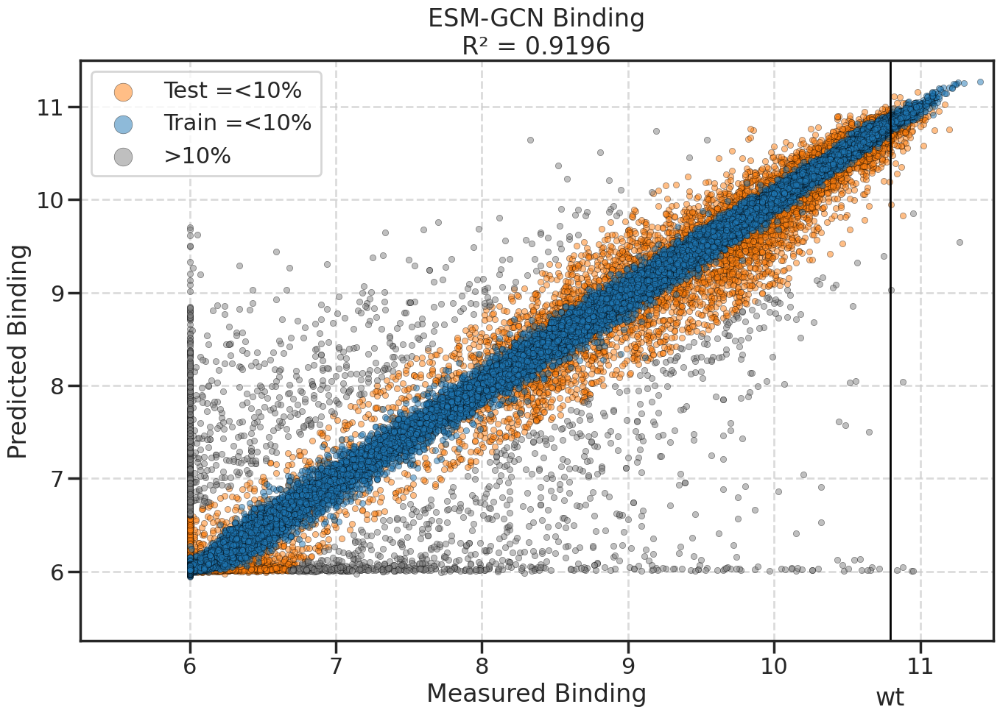

In [5]:
df = pd.read_csv("esm_gcn/esm_gcn.C.binding-predicted_vs_measured.values.csv")
esm_gcn_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.C.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.903444761431969
R^2 outside of threshold: -0.39196823948808834
R^2 inside of threshold: 0.9837430254236049
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 2522, or 12.20% of all test points


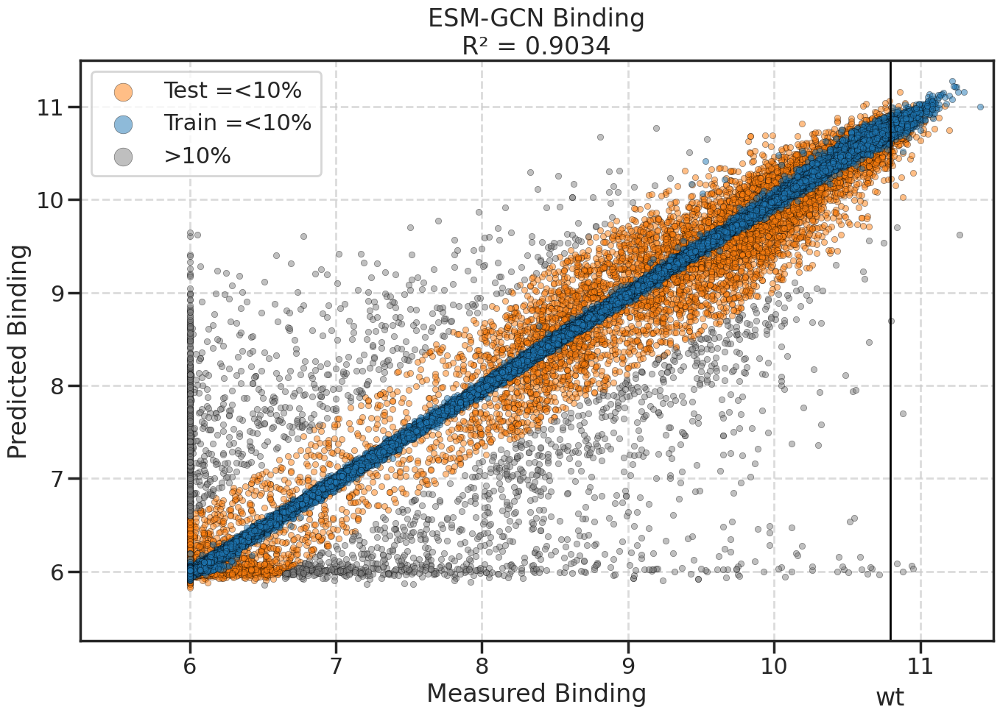

In [6]:
df = pd.read_csv("esm_gcn/esm_gcn.D.binding-predicted_vs_measured.values.csv")
esm_gcn_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.D.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.6259271365326263
R^2 outside of threshold: -0.13370474567263302
R^2 inside of threshold: 0.959817439880768
Number of TRAIN points outside of error threshold: 24652, or 30.00% of all train points
Number of TEST points outside of error threshold: 7526, or 36.40% of all test points


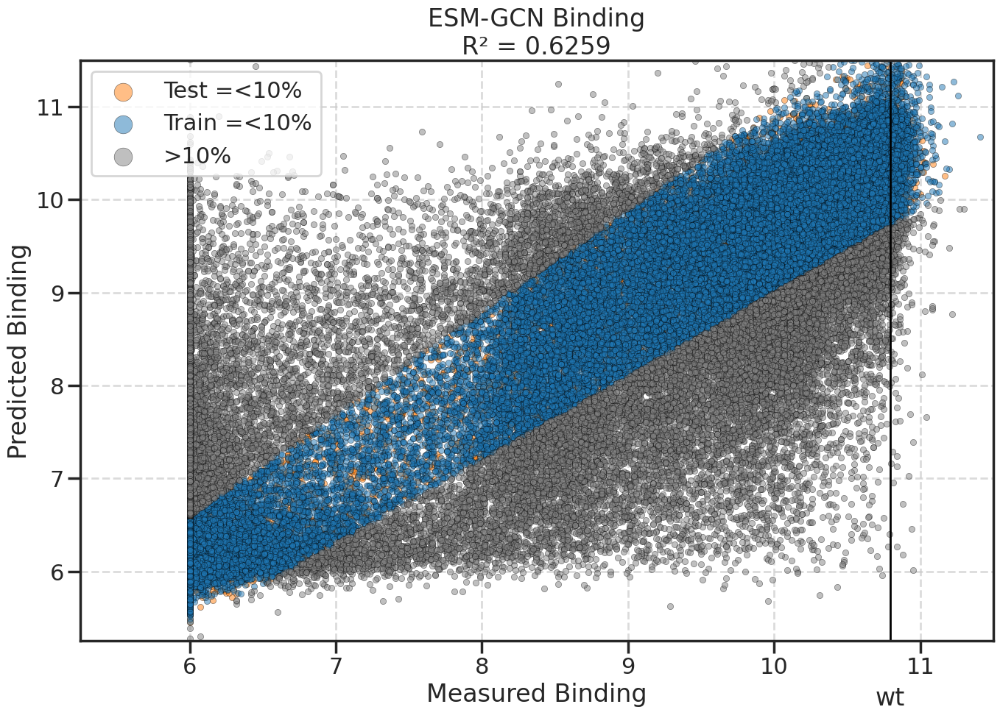

In [7]:
df = pd.read_csv("esm_gcn/esm_gcn.E.binding-predicted_vs_measured.values.csv")
esm_gcn_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.E.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.5919279886185052
R^2 outside of threshold: 0.11391007119554608
R^2 inside of threshold: 0.946722076048361
Number of TRAIN points outside of error threshold: 36017, or 43.83% of all train points
Number of TEST points outside of error threshold: 9262, or 44.80% of all test points


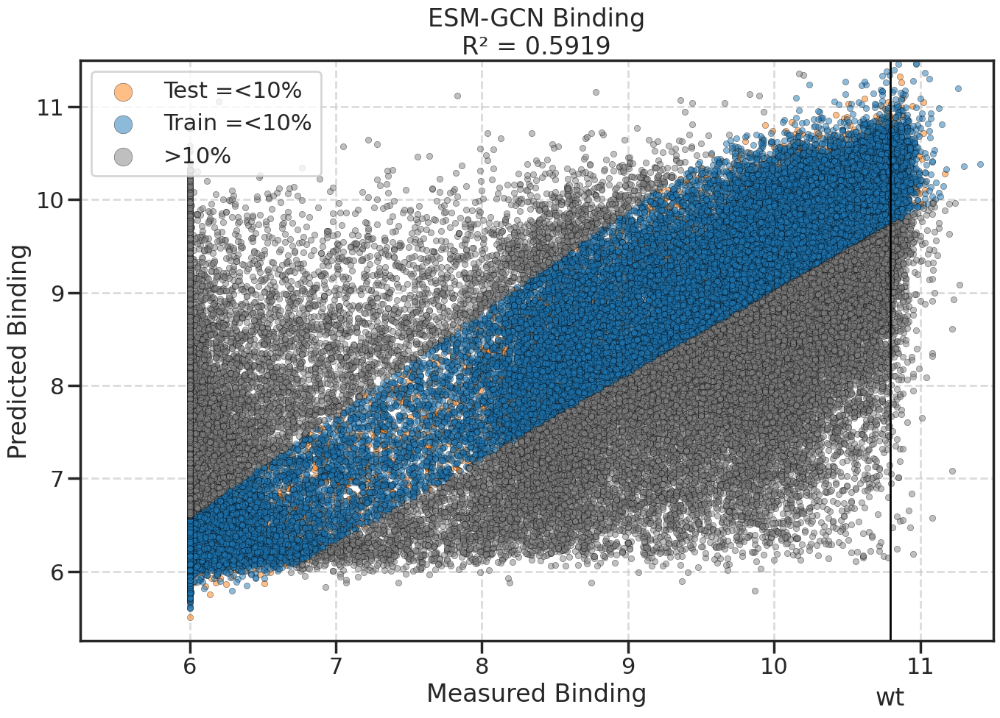

In [8]:
df = pd.read_csv("esm_gcn/esm_gcn.F.binding-predicted_vs_measured.values.csv")
esm_gcn_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.F.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.9162491091919898
R^2 outside of threshold: -0.5668054509522336
R^2 inside of threshold: 0.9869999576192451
Number of TRAIN points outside of error threshold: 1, or 0.00% of all train points
Number of TEST points outside of error threshold: 2121, or 10.26% of all test points


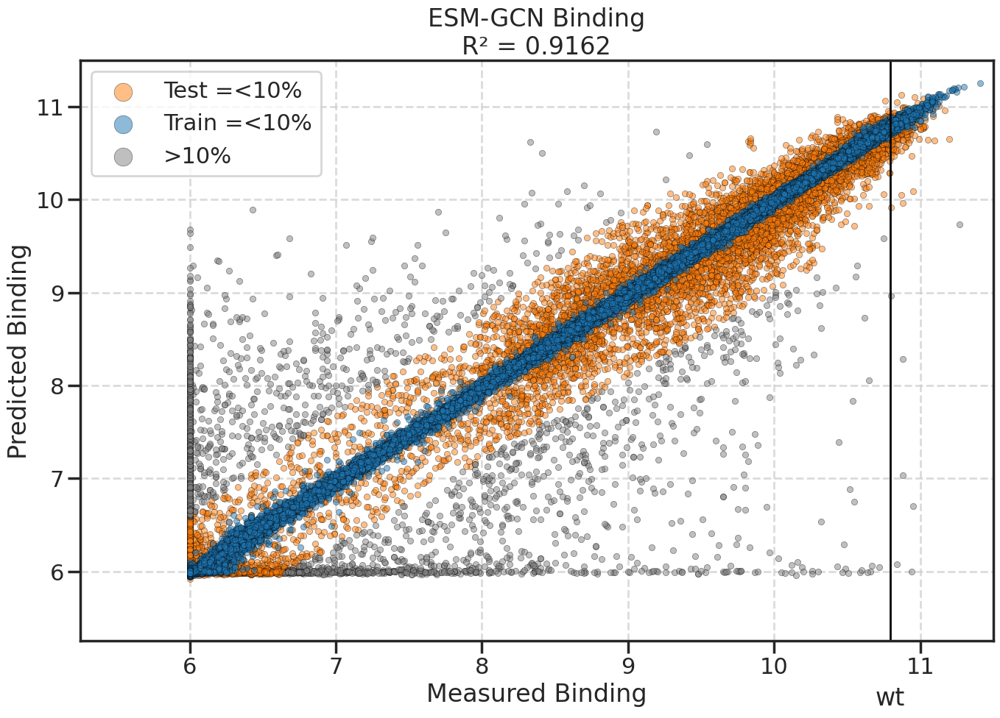

In [9]:
df = pd.read_csv("esm_gcn/esm_gcn.G.binding-predicted_vs_measured.values.csv")
esm_gcn_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.G.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.8992566949102083
R^2 outside of threshold: -0.3302986430948154
R^2 inside of threshold: 0.9832321264891417
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 2746, or 13.28% of all test points


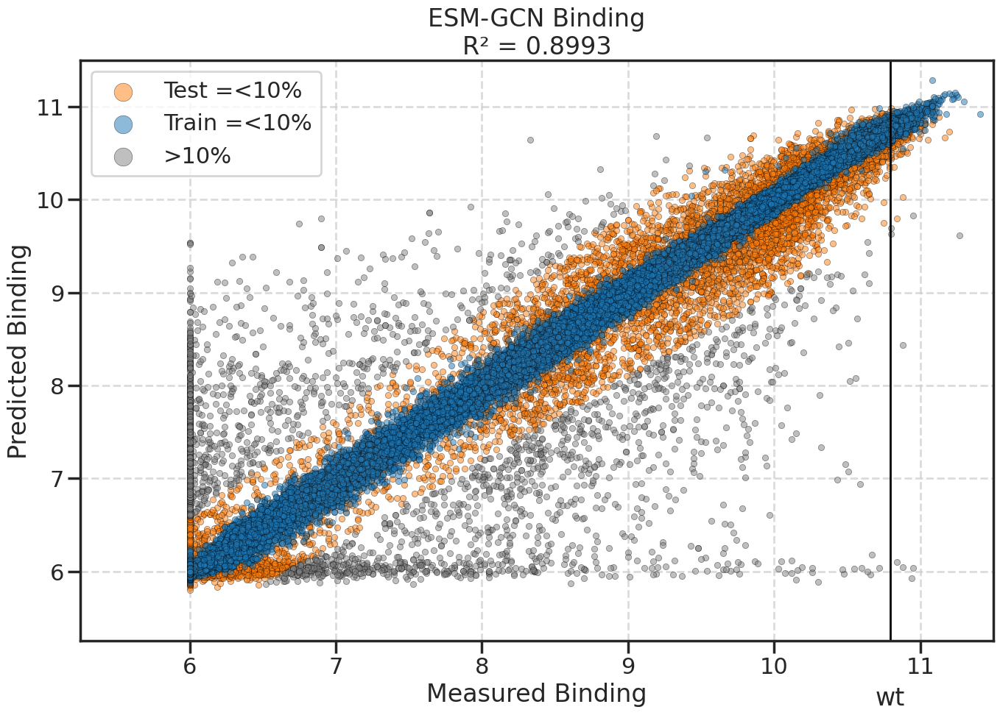

In [10]:
df = pd.read_csv("esm_gcn/esm_gcn.H.binding-predicted_vs_measured.values.csv")
esm_gcn_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "esm_gcn/esm_gcn.H.binding-predicted_vs_measured.scatter", binding_wt)

Expression

R^2: 0.6303015001344698
R^2 outside of threshold: -0.24752780923022666
R^2 inside of threshold: 0.8375060031347614
Number of TRAIN points outside of error threshold: 6034, or 7.34% of all train points
Number of TEST points outside of error threshold: 2960, or 14.32% of all test points


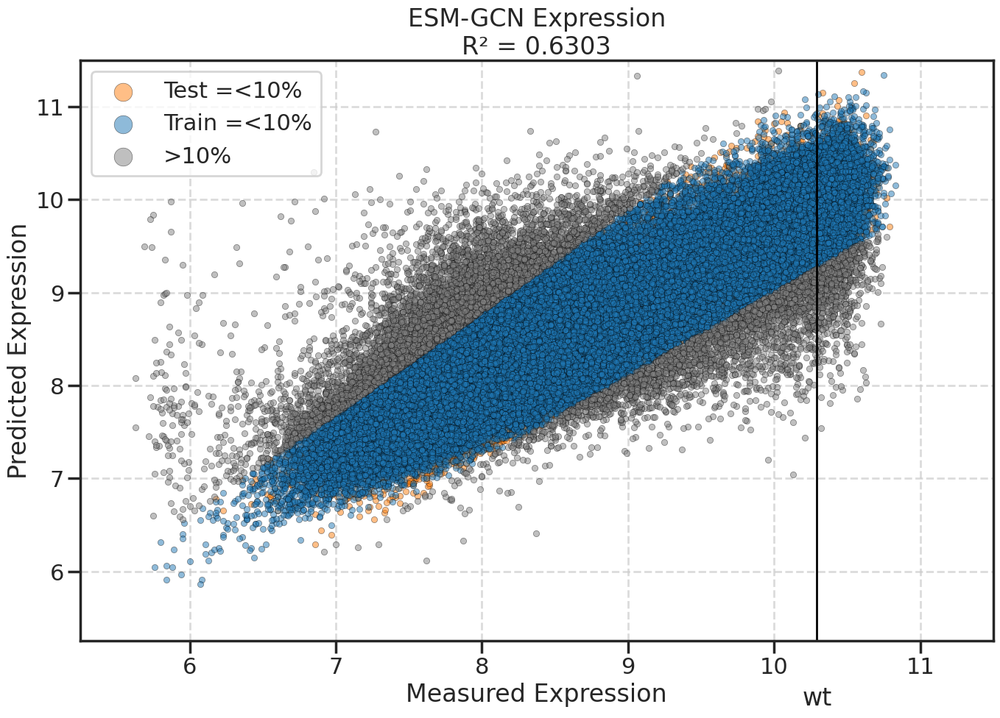

In [11]:
df = pd.read_csv("esm_gcn/esm_gcn.A.expression-predicted_vs_measured.values.csv")
esm_gcn_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.A.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.5931577242894228
R^2 outside of threshold: -0.09666416606779249
R^2 inside of threshold: 0.8210415495384868
Number of TRAIN points outside of error threshold: 12018, or 14.62% of all train points
Number of TEST points outside of error threshold: 3369, or 16.30% of all test points


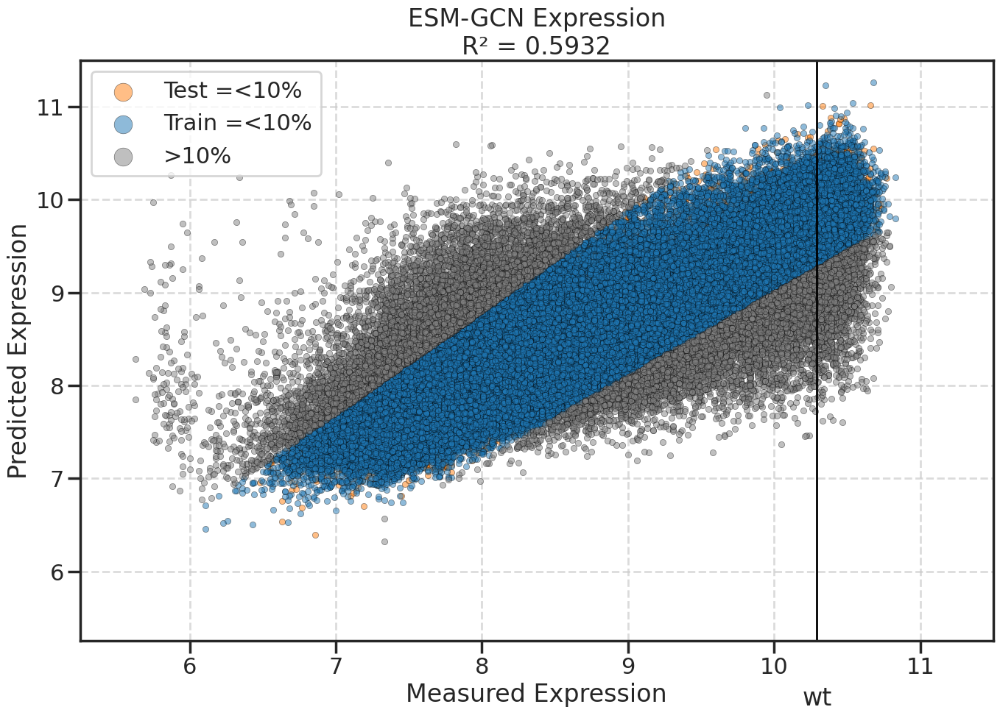

In [12]:
df = pd.read_csv("esm_gcn/esm_gcn.B.expression-predicted_vs_measured.values.csv")
esm_gcn_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.B.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8926950771489923
R^2 outside of threshold: -0.1362878850671705
R^2 inside of threshold: 0.9230667088854502
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 464, or 2.24% of all test points


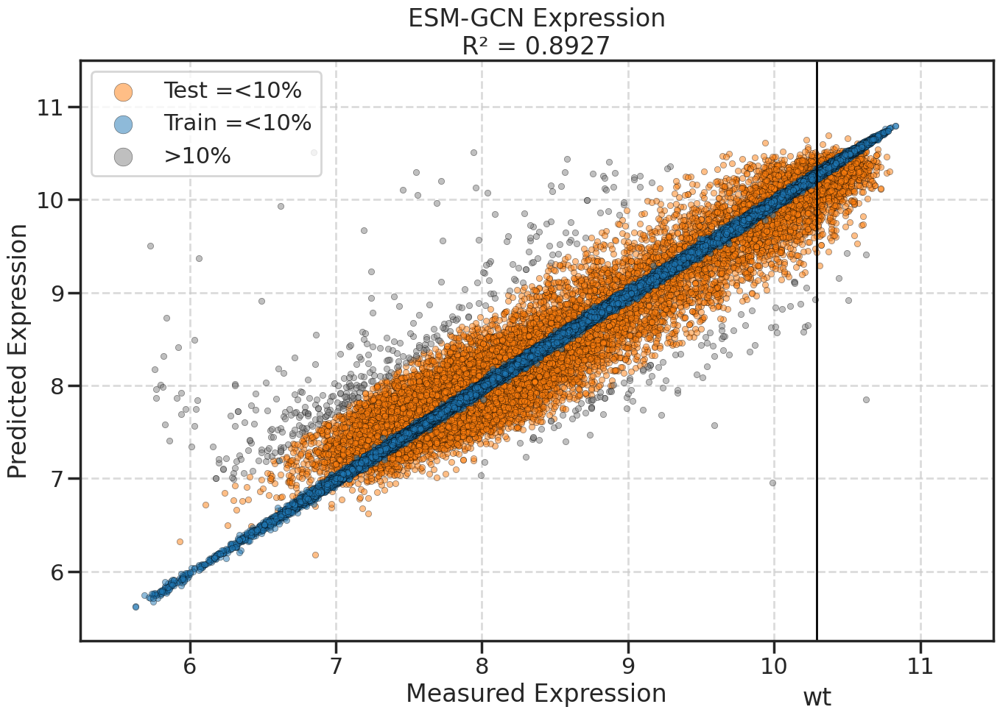

In [13]:
df = pd.read_csv("esm_gcn/esm_gcn.C.expression-predicted_vs_measured.values.csv")
esm_gcn_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.C.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8754973788783561
R^2 outside of threshold: 0.003407734725562439
R^2 inside of threshold: 0.911487539315595
Number of TRAIN points outside of error threshold: 895, or 1.09% of all train points
Number of TEST points outside of error threshold: 585, or 2.83% of all test points


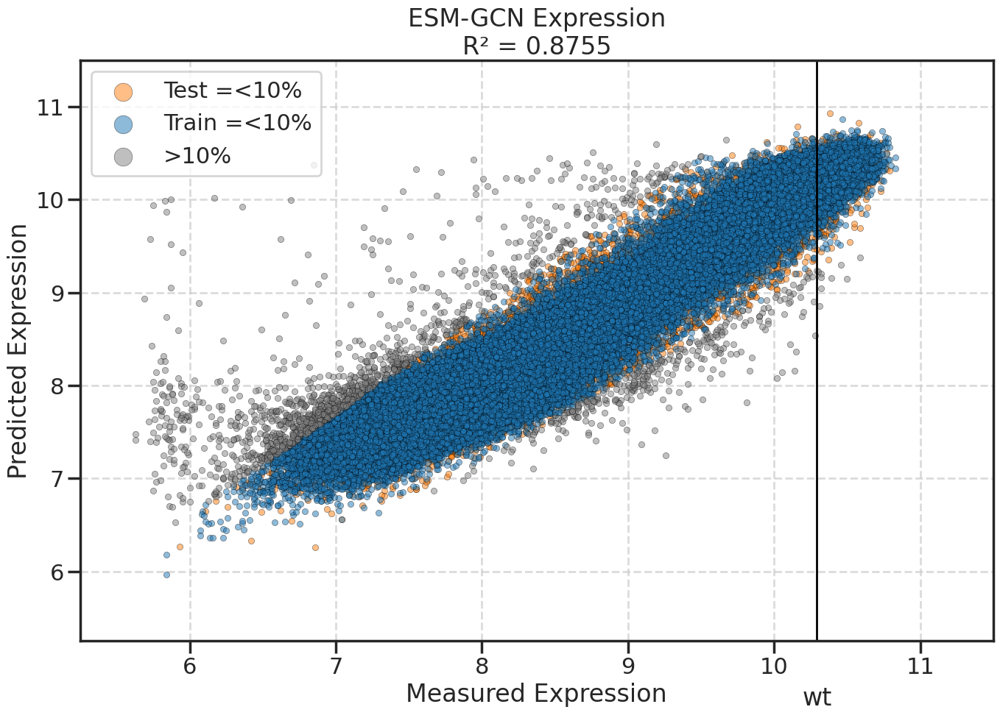

In [14]:
df = pd.read_csv("esm_gcn/esm_gcn.D.expression-predicted_vs_measured.values.csv")
esm_gcn_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.D.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.5591051986637673
R^2 outside of threshold: -0.14494203679164874
R^2 inside of threshold: 0.8107585236150273
Number of TRAIN points outside of error threshold: 8440, or 10.27% of all train points
Number of TEST points outside of error threshold: 3524, or 17.05% of all test points


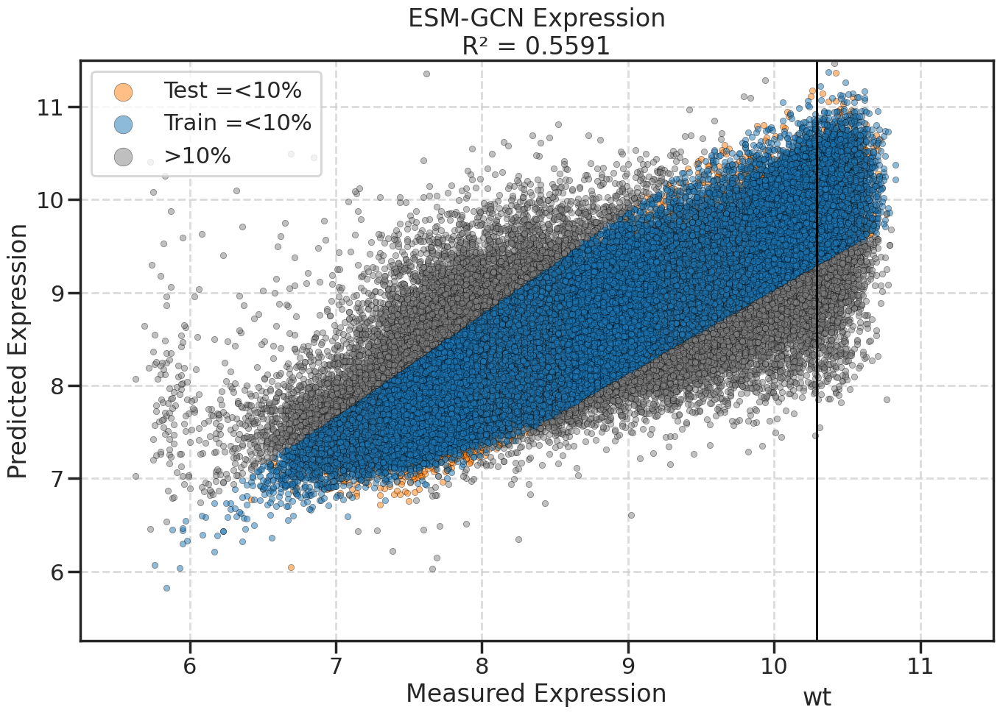

In [15]:
df = pd.read_csv("esm_gcn/esm_gcn.E.expression-predicted_vs_measured.values.csv")
esm_gcn_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.E.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.4912790196623207
R^2 outside of threshold: -0.07550759148836139
R^2 inside of threshold: 0.7792014894665843
Number of TRAIN points outside of error threshold: 17345, or 21.11% of all train points
Number of TEST points outside of error threshold: 4418, or 21.37% of all test points


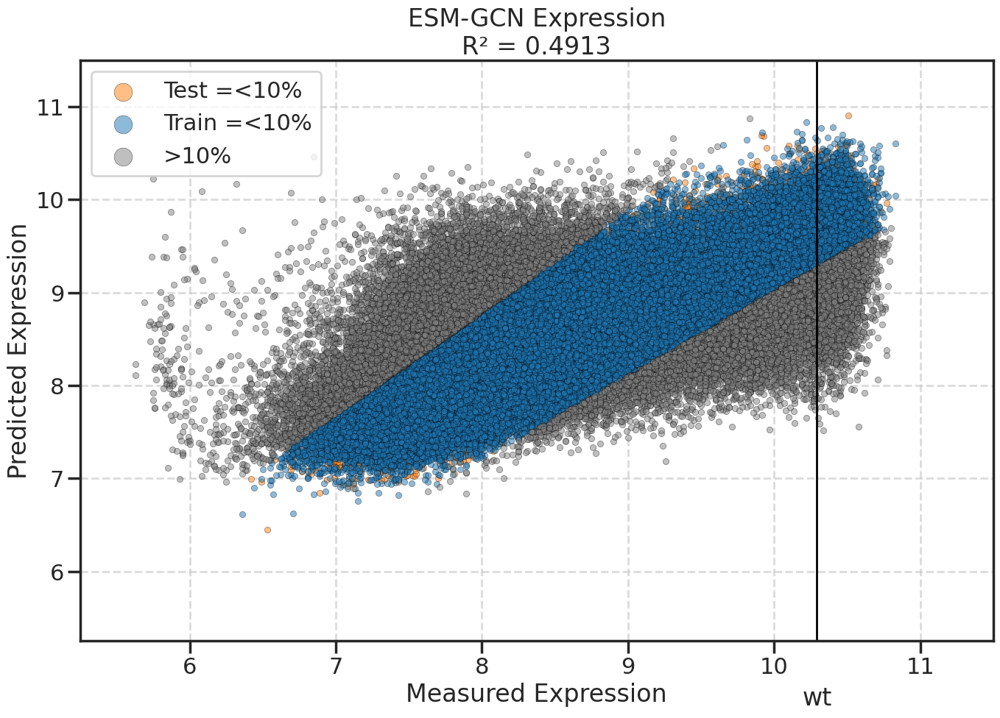

In [16]:
df = pd.read_csv("esm_gcn/esm_gcn.F.expression-predicted_vs_measured.values.csv")
esm_gcn_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.F.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8843293205490695
R^2 outside of threshold: -0.03615935129091952
R^2 inside of threshold: 0.9166117845504385
Number of TRAIN points outside of error threshold: 0, or 0.00% of all train points
Number of TEST points outside of error threshold: 520, or 2.52% of all test points


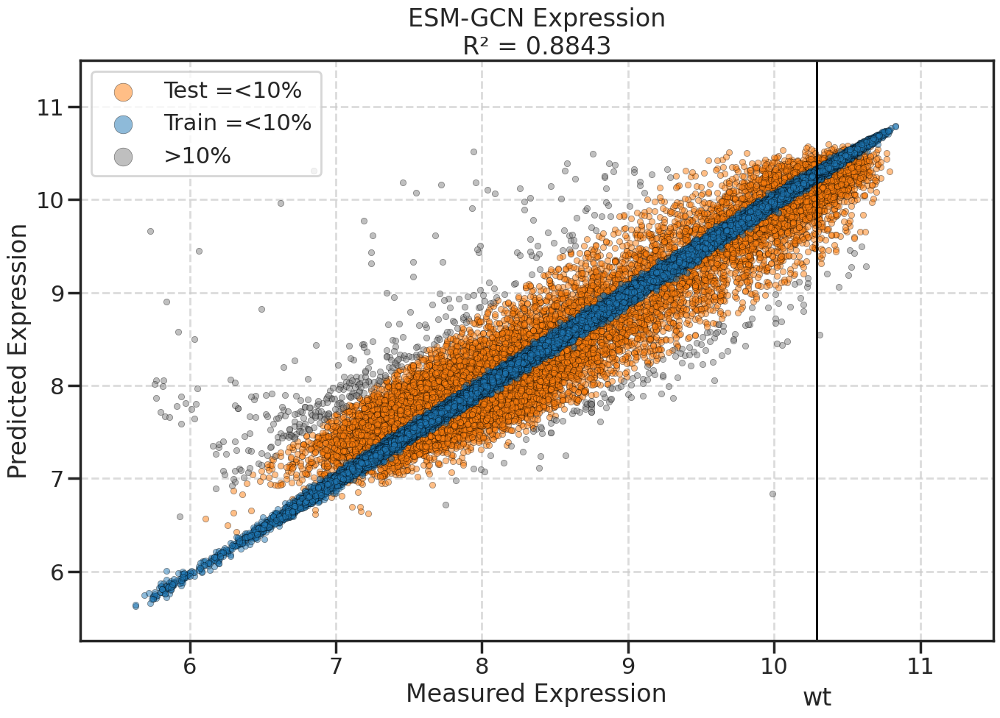

In [17]:
df = pd.read_csv("esm_gcn/esm_gcn.G.expression-predicted_vs_measured.values.csv")
esm_gcn_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.G.expression-predicted_vs_measured.scatter", expression_wt)

R^2: 0.8648155619842173
R^2 outside of threshold: -0.031175407024727653
R^2 inside of threshold: 0.9086437482573937
Number of TRAIN points outside of error threshold: 1176, or 1.43% of all train points
Number of TEST points outside of error threshold: 750, or 3.63% of all test points


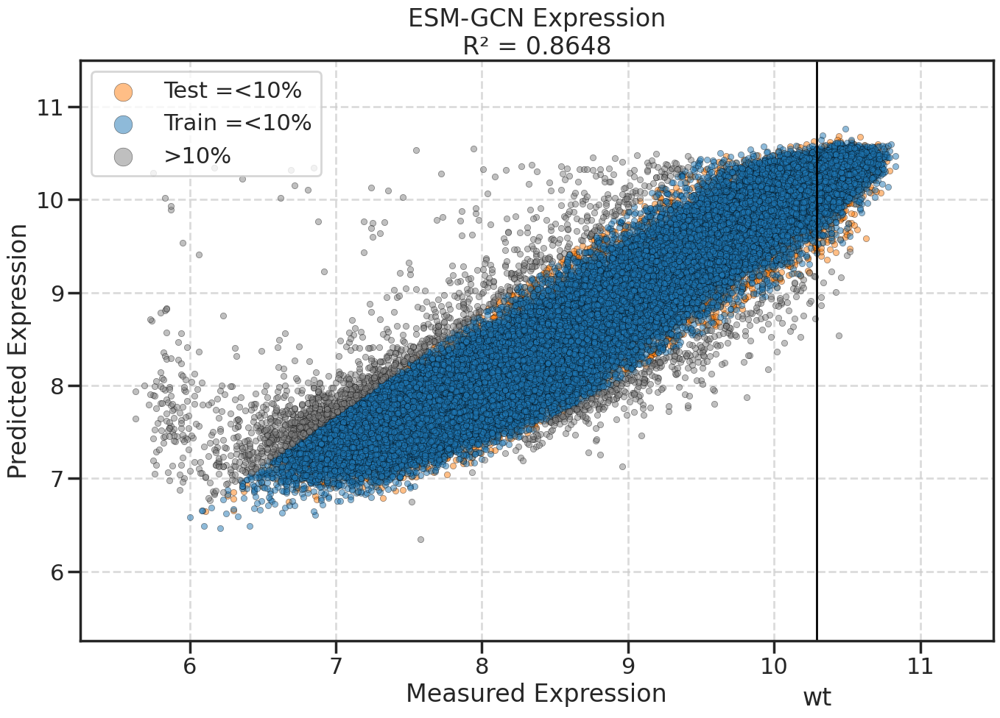

In [18]:
df = pd.read_csv("esm_gcn/esm_gcn.H.expression-predicted_vs_measured.values.csv")
esm_gcn_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "esm_gcn/esm_gcn.H.expression-predicted_vs_measured.scatter", expression_wt)

In [19]:
r2_dict = {
    "A.binding": esm_gcn_a_binding,
    "A.expression": esm_gcn_a_expression,
    "B.binding": esm_gcn_b_binding,
    "B.expression": esm_gcn_b_expression,
    "C.binding": esm_gcn_c_binding,
    "C.expression": esm_gcn_c_expression,
    "D.binding": esm_gcn_d_binding,
    "D.expression": esm_gcn_d_expression,
    "E.binding": esm_gcn_e_binding,
    "E.expression": esm_gcn_e_expression,
    "F.binding": esm_gcn_f_binding,
    "F.expression": esm_gcn_f_expression,
    "G.binding": esm_gcn_g_binding,
    "G.expression": esm_gcn_g_expression,
    "H.binding": esm_gcn_h_binding,
    "H.expression": esm_gcn_h_expression
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")

A.binding: 0.622462984954167
A.expression: 0.6303015001344698
B.binding: 0.6232924351054802
B.expression: 0.5931577242894228
C.binding: 0.9195505139243738
C.expression: 0.8926950771489923
D.binding: 0.903444761431969
D.expression: 0.8754973788783561
E.binding: 0.6259271365326263
E.expression: 0.5591051986637673
F.binding: 0.5919279886185052
F.expression: 0.4912790196623207
G.binding: 0.9162491091919898
G.expression: 0.8843293205490695
H.binding: 0.8992566949102083
H.expression: 0.8648155619842173


---
### Best RMSE Plots (C Binding, C Expression)

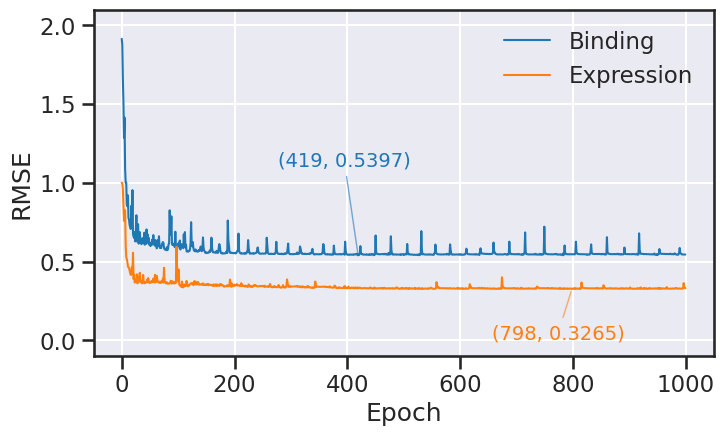

In [12]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../../../src/pnlp/ESM_TL/logs/"
binding_test = os.path.join(log_dir, "esm_gcn/version_21774828/metrics.csv")
expression_test = os.path.join(log_dir, "esm_gcn/version_21774827/metrics.csv")

binding_df = pd.read_csv(
    binding_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
binding_merged_df = binding_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in binding_merged_df.columns:
    binding_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
binding_merged_df.loc[:, "epoch"] = (binding_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
binding_merged_df = binding_merged_df.sort_values("epoch").reset_index(drop=True)
binding_best_epoch = binding_merged_df.loc[binding_merged_df['val_rmse'].idxmin()]

expression_df = pd.read_csv(
    expression_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
expression_merged_df = expression_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in expression_merged_df.columns:
    expression_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
expression_merged_df.loc[:, "epoch"] = (expression_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
expression_merged_df = expression_merged_df.sort_values("epoch").reset_index(drop=True)
expression_best_epoch = expression_merged_df.loc[expression_merged_df['val_rmse'].idxmin()]

# Plot
sns.set_style('ticks')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(binding_merged_df['epoch'], binding_merged_df['val_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(expression_merged_df['epoch'], expression_merged_df['val_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)
plt.grid(axis="y", linestyle="-", alpha=1, color='white')
plt.grid(axis="x", linestyle="-", alpha=1, color='white')
ax.set_facecolor('#EAEAF2') 

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, 75), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "../../rmse/best_esm_gcn-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')